In [156]:
import os

import cv2
import numpy as np
import imutils

from matplotlib import pyplot as plt
from PIL import Image as pil_image

# Utilities

In [157]:
def imgs_show(imgs, rows, fontsize=36):
    fig = plt.figure()
    for n, (img, title) in enumerate(imgs):
        a = fig.add_subplot(rows, np.ceil(len(imgs)/float(rows)), n + 1)
        a.set_title(title, fontdict={"fontsize": fontsize})
        plt.imshow(img)
    fig.set_size_inches(np.array(fig.get_size_inches()) * len(imgs))
    plt.show()
    
def img_show(img, title = '', figsize=(10, 5)):
    plt.figure(figsize=figsize)
    plt.gray()
    plt.imshow(img)
    plt.title(title)
    plt.show()

def read_folder(folder, ext):
    images = []

    for r, d, f in os.walk(folder):
        for file in f:
            if file.endswith(ext):
                path = os.path.join(r, file)
                images.append(pil_image.open(path))
    return images

def process_contours(grayscaled, threshold, contours, thre=(11, 11), denoise=(60, 7, 15)):
    result = np.full((grayscaled.shape[0], grayscaled.shape[1]), 255, dtype=np.uint8)
    for contour in contours:
        [x, y, w, h] = cv2.boundingRect(contour)
        y1 = y+h
        x1 = x+w 
        rect = grayscaled[y:y1-1, x:x1-1]
        if np.mean(rect) > np.median(rect):
            rect = 255 - rect
        rect_thresholded = cv2.adaptiveThreshold(rect, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, *thre)
        result[y:y1-1, x:x1-1] = cv2.fastNlMeansDenoising(rect_thresholded, None, *denoise)
    return result

# Images

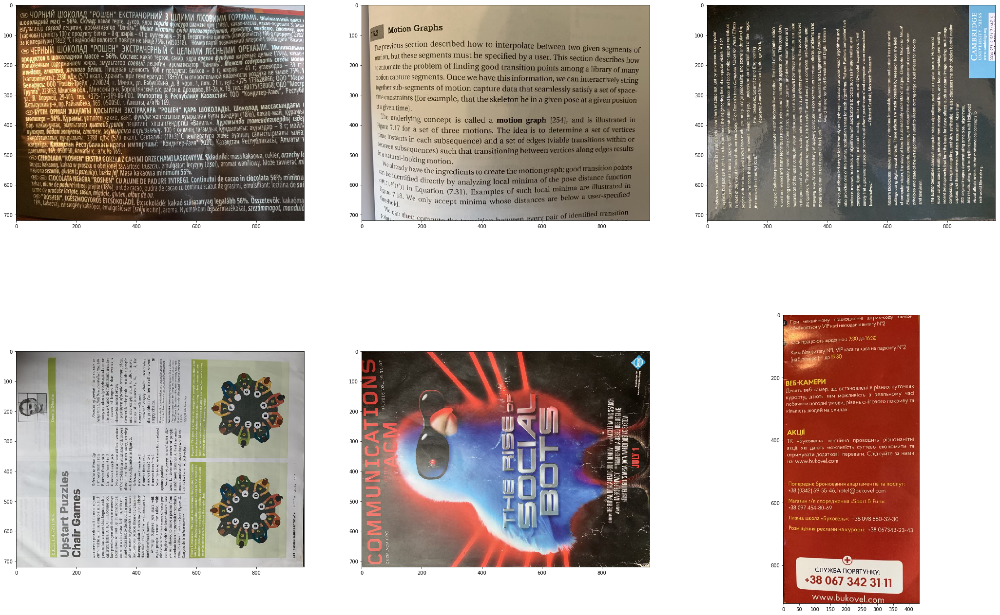

In [158]:
images = read_folder('./text/', '.jpg')
imgs_show([(img, "") for img in images], 2)

# Separate text from background

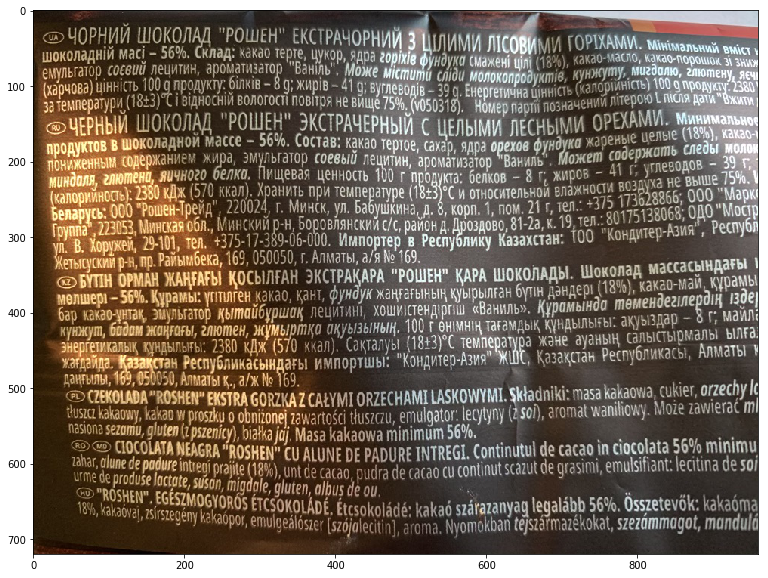

In [159]:
img_show(np.array(images[0]), figsize=(15, 10))

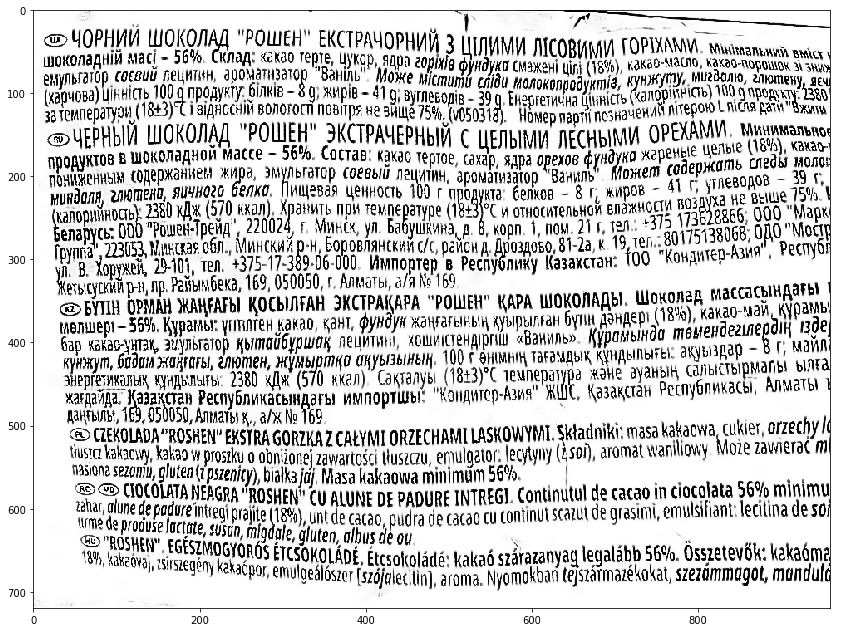

In [160]:
def extract_text_img_0(img):
    grayscaled = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    threshold = cv2.adaptiveThreshold(grayscaled, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 15, 5)
    denoised = cv2.fastNlMeansDenoising(threshold, None, 90, 5, 15)
    contours, hierarchy = cv2.findContours(denoised, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    return process_contours(grayscaled, threshold, contours)

img_show(extract_text_img_0(np.array(images[0])), figsize=(24, 11))

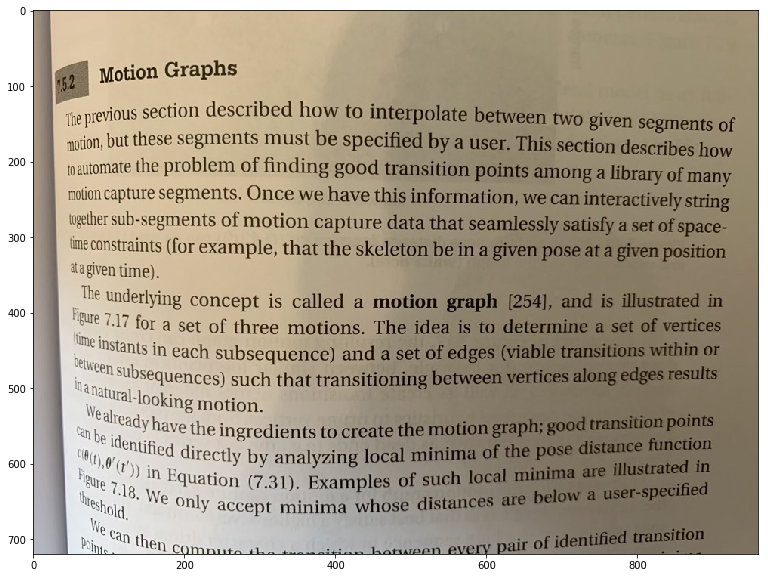

In [161]:
img_show(np.array(images[1]), figsize=(15, 10))

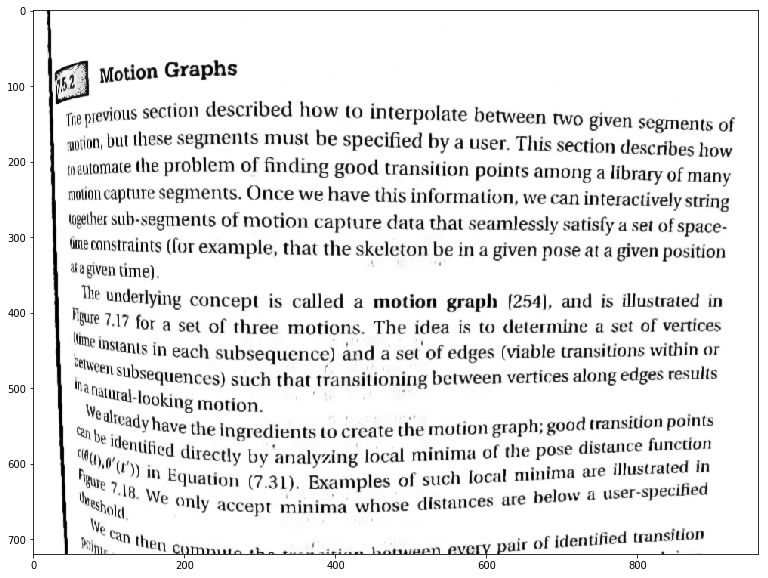

In [162]:
def extract_text_img_1(img):
    grayscaled = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    threshold = cv2.adaptiveThreshold(grayscaled, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 15, 5)
    return cv2.fastNlMeansDenoising(threshold, None, 80, 5, 15)

img_show(extract_text_img_1(np.array(images[1])), figsize=(15, 10))

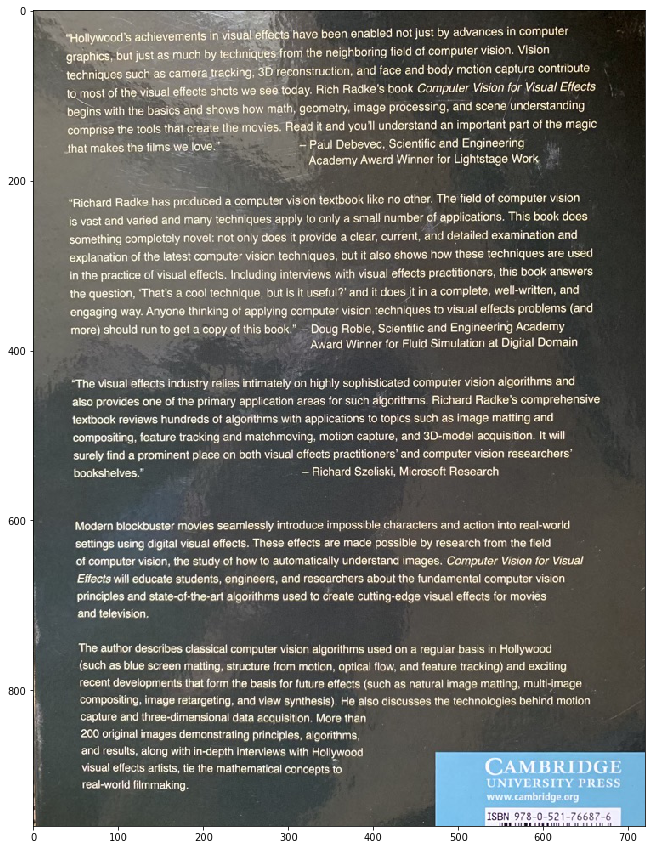

In [163]:
img_show(np.array(images[2].transpose(pil_image.ROTATE_270)), figsize=(30, 15))

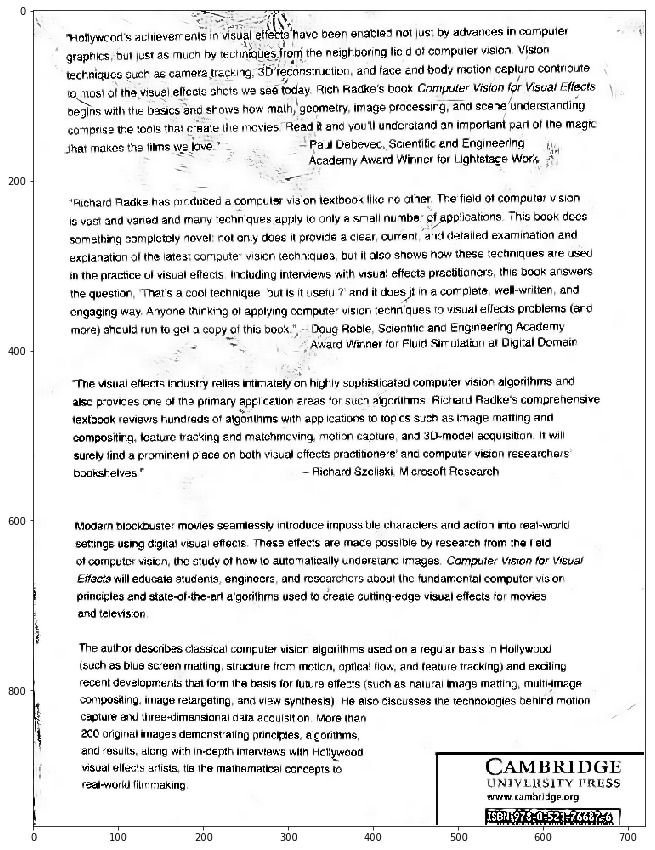

In [164]:
def extract_text_img_2(img):
    grayscaled = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    threshold = cv2.adaptiveThreshold(grayscaled, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 15, 5)
    denoised = cv2.fastNlMeansDenoising(threshold, None, 90, 5, 15)
    contours, hierarchy = cv2.findContours(denoised, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    return process_contours(grayscaled, threshold, contours)

img_show(extract_text_img_0(np.array(images[2].transpose(pil_image.ROTATE_270))), figsize=(30, 15))

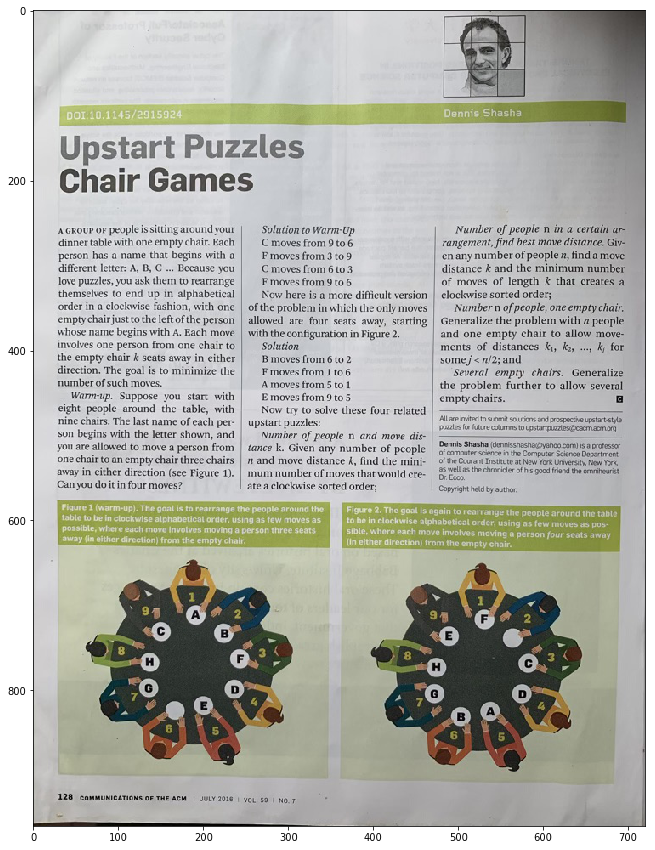

In [165]:
img_show(np.array(images[3].transpose(pil_image.ROTATE_270)), figsize=(30, 15))

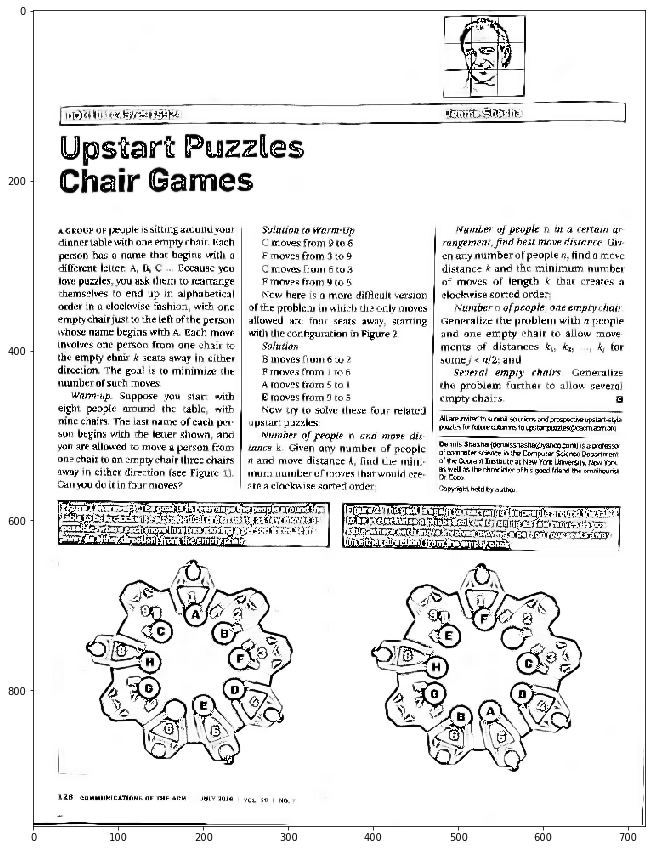

In [166]:
def extract_text_img_3(img):
    grayscaled = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    threshold = cv2.adaptiveThreshold(grayscaled, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 15, 5)
    contours, hierarchy = cv2.findContours(threshold, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    return process_contours(grayscaled, threshold, contours, thre=(7, 7), denoise=(90, 7, 5))

img_show(extract_text_img_0(np.array(images[3].transpose(pil_image.ROTATE_270))), figsize=(30, 15))

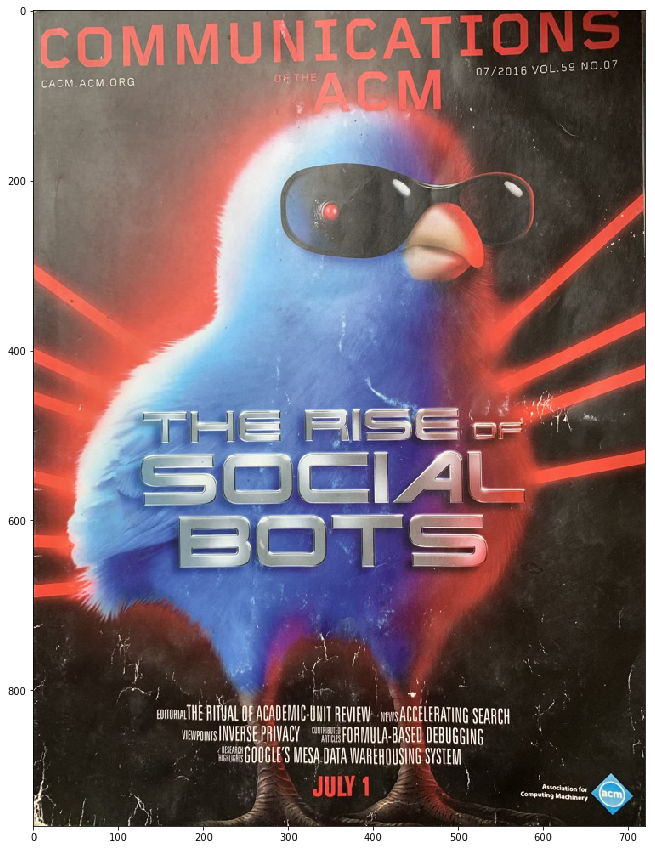

In [167]:
img_show(np.array(images[4].transpose(pil_image.ROTATE_270)), figsize=(30, 15))

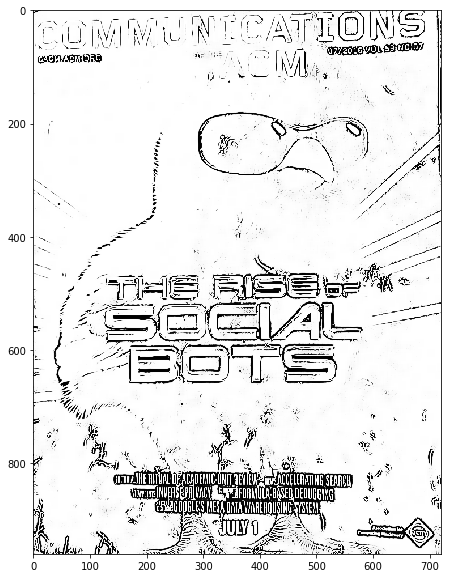

In [169]:
def extract_text_img_4(img):
    grayscaled = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    threshold = cv2.adaptiveThreshold(grayscaled, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 7)
    return cv2.fastNlMeansDenoising(threshold, None, 60, 5, 15)

img_show(extract_text_img_4(np.array(images[4].transpose(pil_image.ROTATE_270))), figsize=(15, 10))

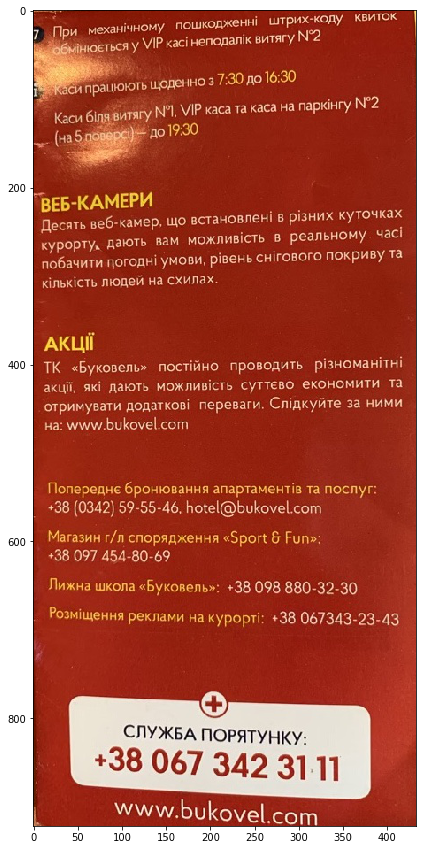

In [171]:
img_show(np.array(images[5]), figsize=(30, 15))

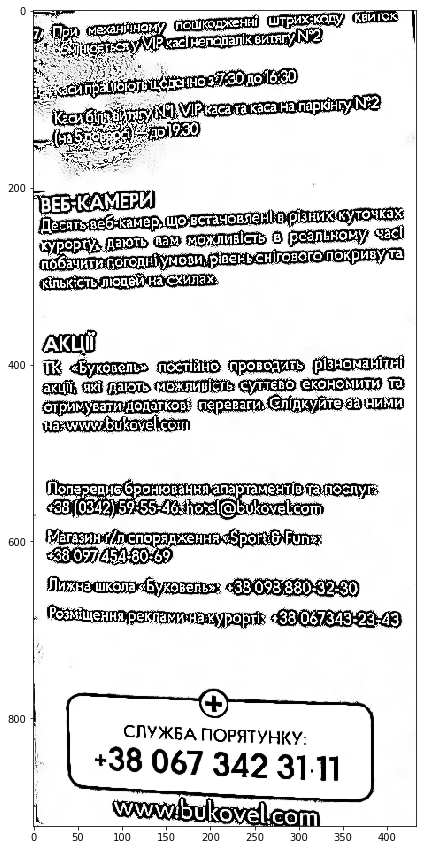

In [172]:
def extract_text_img_5(img):
    grayscaled = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    threshold = cv2.adaptiveThreshold(grayscaled, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 7)
    return cv2.fastNlMeansDenoising(threshold, None, 90, 5, 15)

img_show(extract_text_img_4(np.array(images[5])), figsize=(30, 15))